In [1]:
from specutils import Spectrum1D
from astropy.modeling import models, fitting
import os
import numpy as np
import matplotlib.pyplot as plt
from astropy import units as u

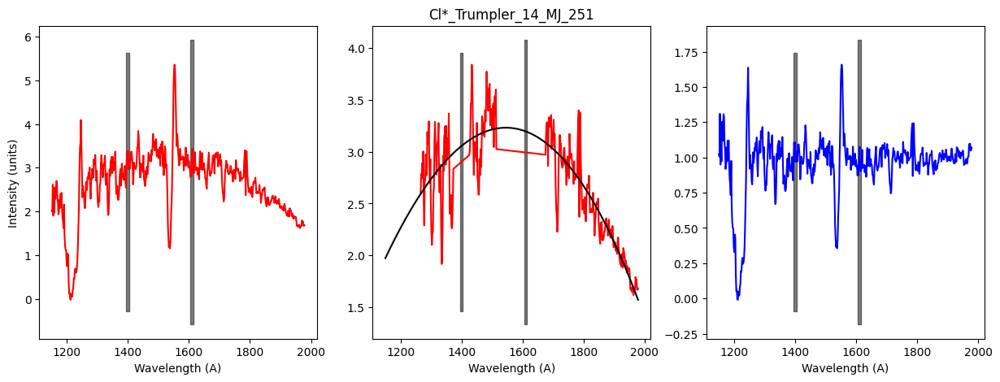

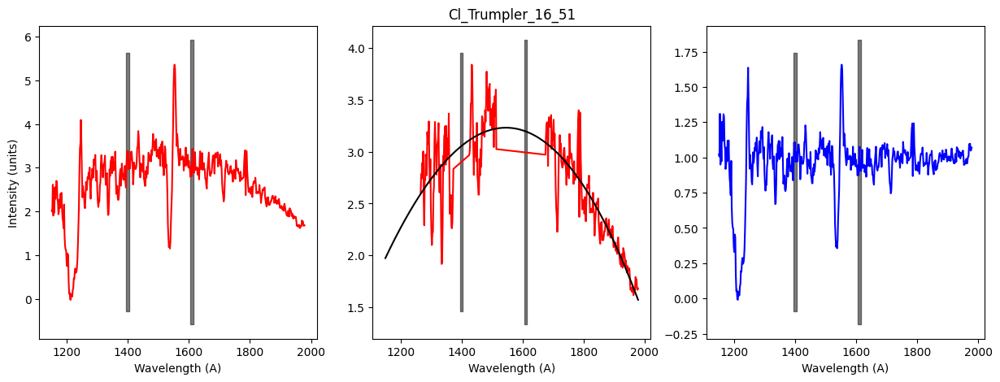

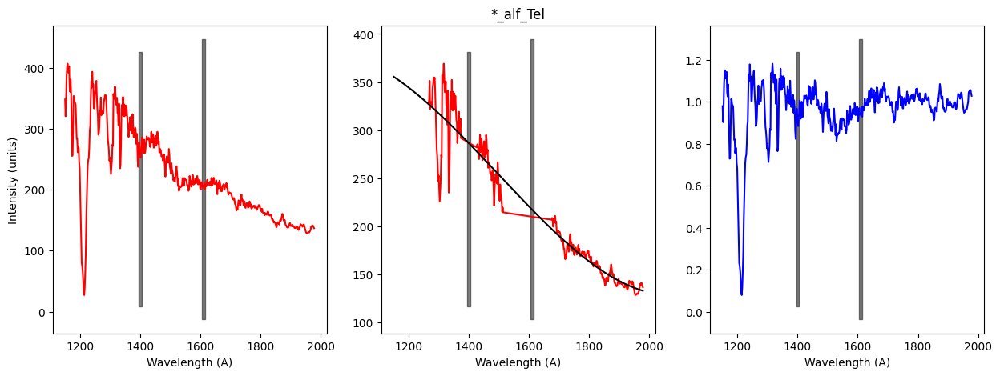

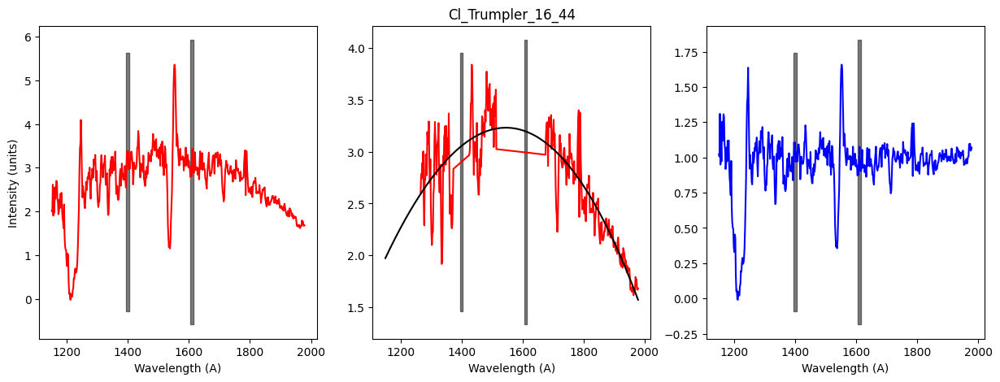

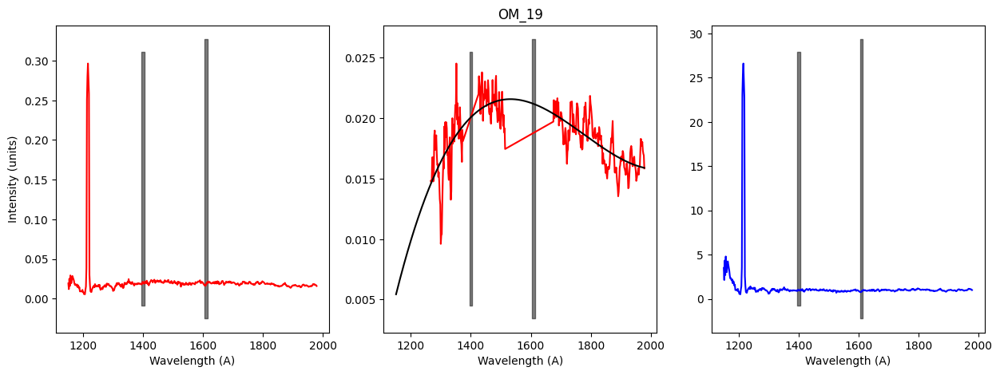

...

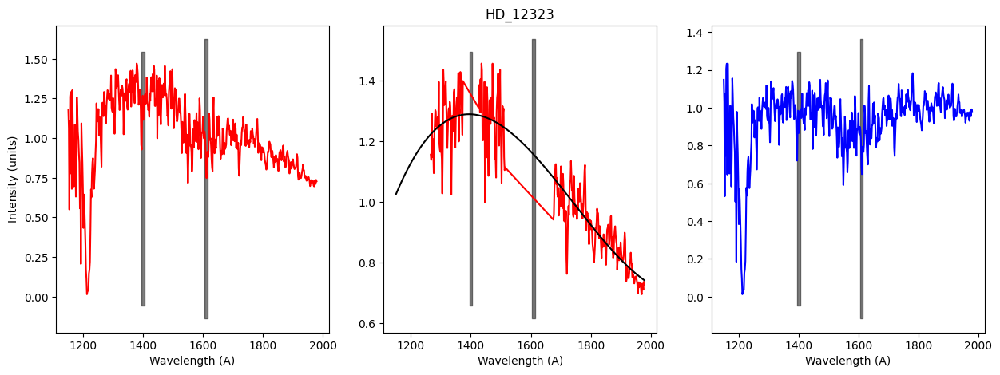

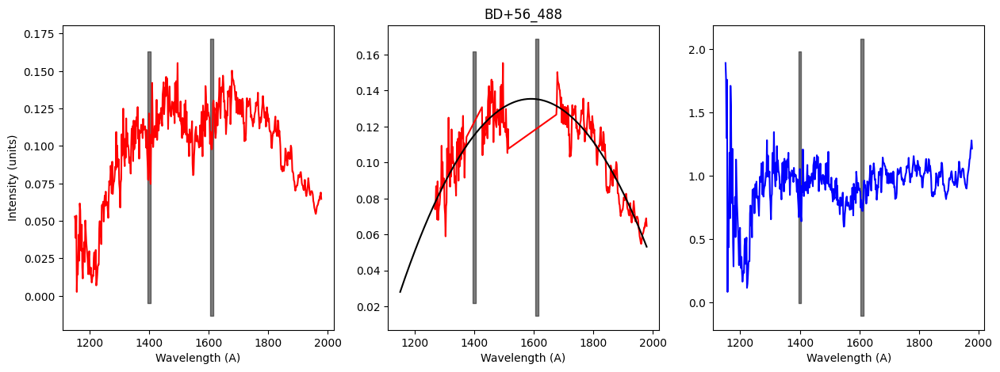

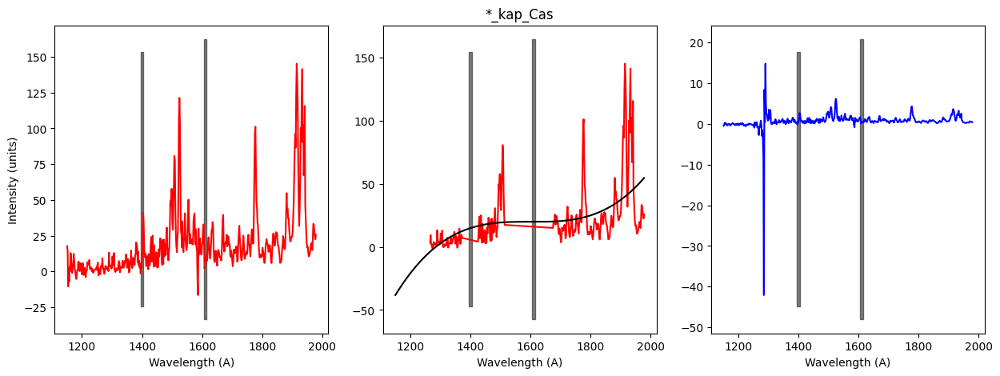

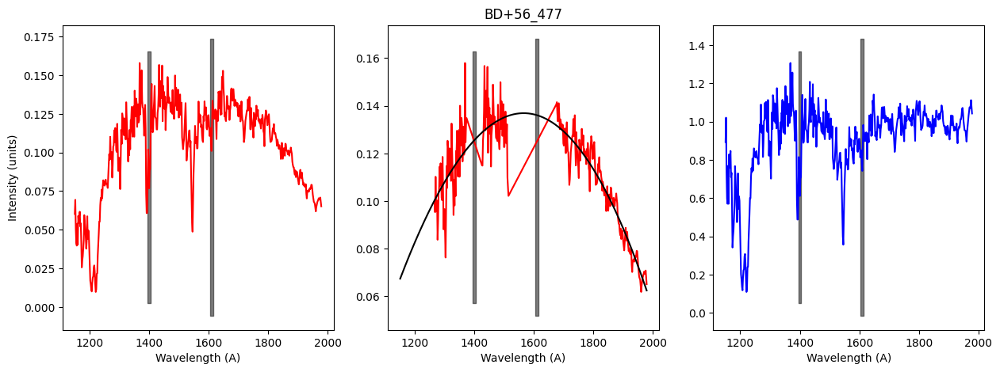

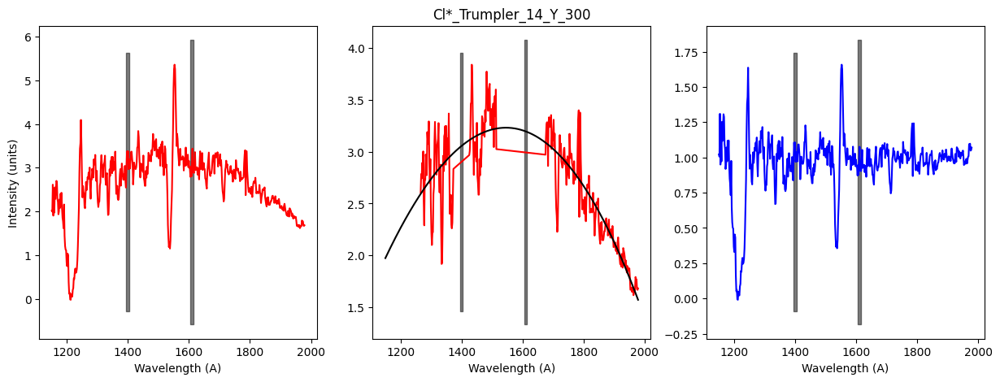

In [7]:

filenames = os.listdir('../ob_catalogue/ob_catalogue_spectra/')
for filename in filenames:

    ### LOAD DATA
    data = np.genfromtxt('../ob_catalogue/ob_catalogue_spectra/' + filename, delimiter=',', dtype='float')
    if data.ndim == 2: data = data[0,:].copy()

    wav = data[:int(data.shape[0]/2)]
    flux = data[int(data.shape[0]/2):]


    ### FIT SPECTRA
    star_spectrum = Spectrum1D(spectral_axis=wav*u.AA, flux=flux*u.Unit('erg s-1 cm-2 AA-1'))

    mask = np.ones_like(wav).astype('bool')
    masked_regions = ['0:1265','1375:1425','1515:1675']
    for region in masked_regions:
        lims = np.array(region.split(':')).astype('float')
        mask *= np.invert((lims[0]<wav)&(wav<lims[1]))

    poly_init = models.Chebyshev1D(degree=3)
    fitter = fitting.LinearLSQFitter()
    cont_model = fitter(poly_init, wav[mask], star_spectrum.flux[mask].value)
    cont_flux = cont_model(wav)
    normalized_flux = star_spectrum.flux/cont_flux


    ### PLOT SPECTRA
    fig, axs = plt.subplots(1, 3, figsize=(15,5))

    axs[0].plot(wav, flux*1e11, c='r', label='og spectrum')
    axs[0].set_xlabel('Wavelength (A)')
    axs[0].set_ylabel('Intensity (units)')

    axs[1].plot(wav[mask], flux[mask]*1e11, c='r', label='cropped spectrum')
    axs[1].plot(wav, cont_flux*1e11, c='k', label='fitted continuum')
    axs[1].set_xlabel('Wavelength (A)')
    axs[1].set_title(filename[:-4])

    # axs[2].plot(wav, flux*1e11, c='r', label='og spectrum')
    axs[2].plot(wav, normalized_flux, c='b', label='norm spectrum')
    axs[2].set_xlabel('Wavelength (A)')

    axs[0].fill_betweenx(axs[0].get_ylim(), 1395, 1405, color='k', alpha=0.5)
    axs[1].fill_betweenx(axs[1].get_ylim(), 1395, 1405, color='k', alpha=0.5)
    axs[2].fill_betweenx(axs[2].get_ylim(), 1395, 1405, color='k', alpha=0.5)
    axs[0].fill_betweenx(axs[0].get_ylim(), 1605, 1615, color='k', alpha=0.5)
    axs[1].fill_betweenx(axs[1].get_ylim(), 1605, 1615, color='k', alpha=0.5)
    axs[2].fill_betweenx(axs[2].get_ylim(), 1605, 1615, color='k', alpha=0.5)

    plt.show()

In [5]:
print(axs[0].get_ylim())

(-0.2912195094448289, 5.62506788977929)
